In [1]:
#from google.colab import drive
#drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install ydata-profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.3/357.3 kB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 9.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 9.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 17.4 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=60306c0a5a11f3e3fe241486e2a79953e09aa985f543cc0743e03f233a87727e
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


## 0. Importar librerias

In [356]:
#Manejo de datos
import pandas as pd
import numpy as np
import scipy.stats as stats

#Analisis profundo de datos
from ydata_profiling import ProfileReport

# Gráficas
import matplotlib.pyplot as plt
import seaborn as sns

#Entrenamiento del modelo
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.linear_model import Lasso, Ridge, LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler, PolynomialFeatures
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.model_selection import GridSearchCV

# Encontrar palabras simlares
from difflib import SequenceMatcher

## 1. Cargar Datos

In [233]:
#data = pd.read_csv('/content/drive/MyDrive/maestria_mine/ciencia_de_datos_aplicada/taller_1/gapminder_final.csv')
data = pd.read_csv('data/gapminder_final.csv')

## 2. Perfilamiento y calidad de datos

In [9]:
data.sample(5)

,country,incomeperperson,alcconsumption,armedforcesrate,breastcancerper100th,co2emissions,femaleemployrate,hivrate,internetuserate,lifeexpectancy,oilperperson,polityscore,relectricperperson,suicideper100th,employrate,urbanrate
99,Peru,3180.430612,6.53,1.435633,35.1,1.146277e+09,59.799999,0.40,34.300604,73.990,0.288893,9.0,239.389457,1.658908,68.300003,71.40
171,Laos,554.879840,6.99,4.301576,10.9,2.133267e+07,78.099998,0.20,6.999880,67.484,NaN,-7.0,NaN,26.219198,78.199997,30.88
78,Slovak Republic,8445.526689,13.31,0.628578,48.0,5.906743e+08,45.299999,0.06,79.889777,75.446,0.677393,10.0,830.701647,10.645740,53.400002,56.56
68,Kuwait,NaN,0.10,1.609548,31.8,1.712755e+09,42.000000,NaN,38.260234,74.576,6.467568,-7.0,8362.567977,1.498057,65.699997,98.36
140,Liberia,155.033231,5.07,0.129953,18.8,3.899133e+07,53.200001,1.50,7.000214,56.786,NaN,6.0,NaN,7.184853,66.000000,60.14


In [ ]:
ProfileReport(data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### 2.1 Dimensiones de los datos

In [234]:
data.shape

(178, 16)

Se ve que hay 178 registros para hacer la regresión, los cuales son relativamente pocos datos en comparación con la cantidad de columnas (10%). Por lo que se tiene que tener cuidado en temas de complejidad del modelo.

### 2.2 Reporte de Nulos

In [238]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 163 entries, 0 to 177
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   country               163 non-null    object 
 1   incomeperperson       163 non-null    float64
 2   alcconsumption        163 non-null    float64
 3   armedforcesrate       159 non-null    float64
 4   breastcancerper100th  162 non-null    float64
 5   co2emissions          161 non-null    float64
 6   femaleemployrate      162 non-null    float64
 7   hivrate               143 non-null    float64
 8   internetuserate       161 non-null    float64
 9   lifeexpectancy        163 non-null    float64
 10  oilperperson          60 non-null     float64
 11  polityscore           153 non-null    float64
 12  relectricperperson    128 non-null    float64
 13  suicideper100th       163 non-null    float64
 14  employrate            162 non-null    float64
 15  urbanrate             1

Vemos que existen varias columnas que cuentan con nulos, la mayoria de estas un porcentaje bastante bajo de los datos. A excepción de hivrate, oilperperson y relectricperperson. Además que existen 14 variables numérica y una categórica. Directamente se eliminan los nulos con la variable dependiente, ya que no es posible imputarlos porque sesgaría el modelo.

In [236]:
data = data.dropna(subset=['incomeperperson'])

### 2.3 Reporte de Duplicados

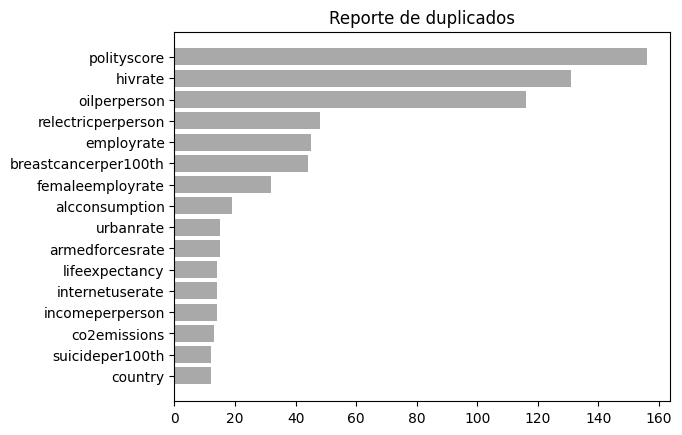

In [8]:
columns = []
duplicates = []
for c in data:
  columns.append(c)
  duplicates.append(data[c].duplicated().sum())

df = pd.DataFrame({'columns':columns,'duplicates':duplicates}).sort_values(by=['duplicates'])
plt.title('Reporte de duplicados')
plt.barh(df['columns'].to_list(), df['duplicates'].to_list(), color='darkgrey')
plt.show()

Encontramos 12 duplicados en la columna country que es categórica. En las demás columnas del dataset que son númericas, los duplicados suelen ser menos importantes.

In [239]:
data = data.drop_duplicates(['country'])

### 2.4 Elección de 5 indicadores más importantes

La variable que queremos predecir es el PIB, por lo tanto hay que entender que las variables que se escojan deben tener influencia directa en la economía y producividad de un país. Por esto, escogemos las siguientes:

- employrate, la tasa de empleo de un país evidentemente tiene una influencia directa en la cantidad de ingreso que genera la clase trabajadora, entre mayor sea mayor productividad habrá en las personas de un país. Todo esto, tiene también influencia en los problemas sanitarios y sociales, dado que un país con alto porcentaje de empleo formal es un país en el que las personas podrán pagar la salud y asegurar su retiro.

- polityscore, además de la productividad de un país es muy importante la estabilidad política y que exista un sistema democrático que permita a las personas salir adelante y que disminuya lo máximo posible la corrupción para que haya la mínima malversación de bienes posible.

- relectricperperson, es una variable que tiene en cuenta el consumo eléctrico por persona en un país lo cual es una medida del desarrollo, ya que a mayor consumo energético quiere decir que tienen más electrodomésticos y mayor desarrollo tecnológico en los hogares, lo cual evidentemente se desprende de una buena situación económica del país.

- urbanrate, Esto nos brinda una medida de si el país tiene una mayor población campesina o urbana, por lo general los países más desarrollados, suelen tener urbes con millones de personas y una minoría en los campos. Los países con escasos recursos suelen tener una población campesina dominante y sus poblados no suelen ser considerados urbes por su falta de servicios básicos.

- co2emissions, se considera que esta variable es sumamente importante dado que los países con mayores recursos suelen tener una cantidad de empresas muy grande lo cual se desprende en emisiones de co2 bastante altas.

Por último, tenemos la variable incomeperperson que es la que vamos a predecir, en este caso hace las veces de pib.


### 2.5 Análisis univariado

#### 2.5.1 Histogramas de variables

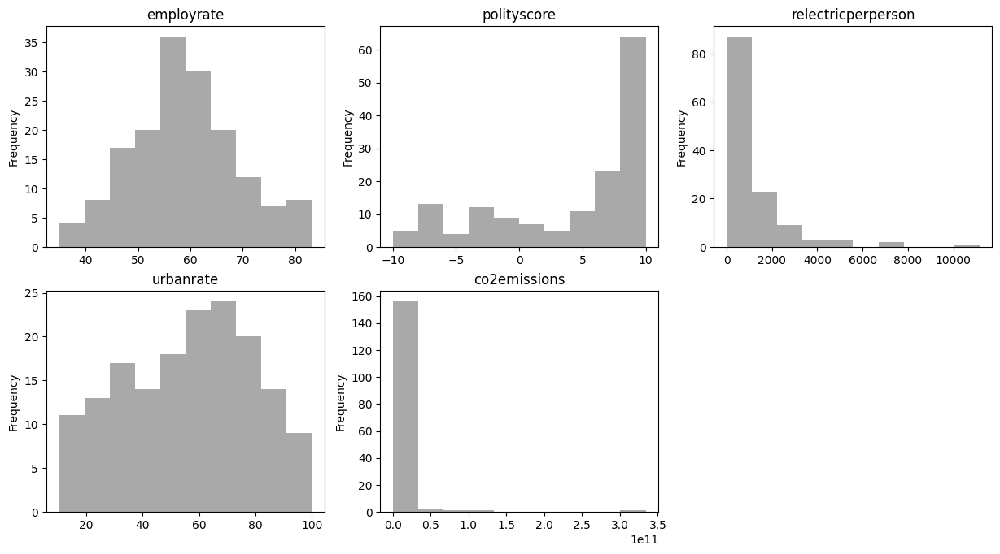

In [240]:
columns = ['employrate', 'polityscore','relectricperperson', 'urbanrate', 'co2emissions']
plt.figure(figsize=(15,12))
for i in range(len(columns)):
  plt.subplot(3,3,i+1)
  plt.title(columns[i])
  data[columns[i]].plot.hist(color='darkgrey')
plt.show()

A partir de los histogramas realizados, se puede observar que las variables employrate y urbanrate tienen una distribución aproximadamente normal, mientras que las variables co2emissions, polityscore y relectricperperson, tienen un distribución con el volumen de datos dirigido a los extremos de los valores. co2emissions y relectricperperson hacia los valores mínimos y polityscore hacia los valores máximos. Esto también podría significar que existen algunos outliers.

#### 2.5.2 Boxplot

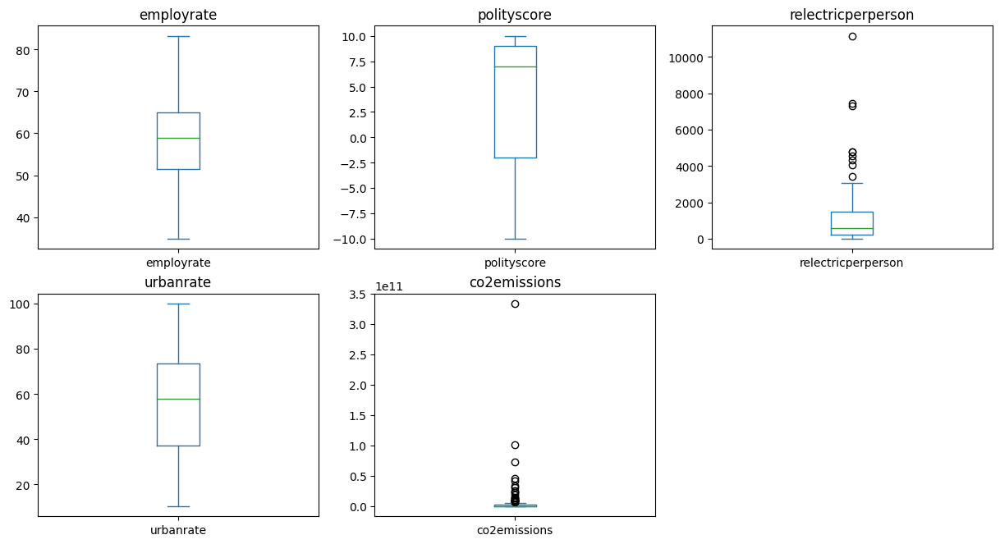

In [241]:
columns = ['employrate', 'polityscore','relectricperperson', 'urbanrate', 'co2emissions']
plt.figure(figsize=(15,12))
for i in range(len(columns)):
  plt.subplot(3,3,i+1)
  plt.title(columns[i])
  data[columns[i]].plot.box()
plt.show()

De estos gráficos se destaca la asimetría de la distribución de los datos para las variables urbanrate y polityscore hacia los valores máximos y la aparición de outliers para las variables co2emissions y relectricperperson. Estos outliers no se consideran necesariamente descartables, dado que sí tiene mucho sentido que las potencias mundiales tengan una cantidad muy superior de emisiones por co2 y consumo eléctrico por persona. Se considera que se pueden dejar en el modelo para que este aprenda la gran variabilidad que hay en estas características para determinados países que son potencias en el mundo.

#### 2.5.3 Estadísticas descriptivas

In [242]:
data[columns].describe()

,employrate,polityscore,relectricperperson,urbanrate,co2emissions
count,162.000000,153.000000,128.000000,163.000000,1.610000e+02
mean,59.074691,3.849673,1144.245457,56.015215,6.156077e+09
std,10.364735,6.226821,1596.990968,22.600016,2.855923e+10
min,34.900002,-10.000000,0.000000,10.400000,8.506667e+05
25%,51.575001,-2.000000,219.736499,37.090000,7.894333e+07
50%,58.850000,7.000000,597.136436,57.940000,2.771707e+08
75%,65.000000,9.000000,1491.145249,73.470000,2.406741e+09
max,83.199997,10.000000,11154.755030,100.000000,3.340000e+11


Se deduce de estas estadísticas que los indicadores polityscore y relectricperperson presentan una gran variabilidad en los datos dado que tienen una desviación estándar considerablemente mayor a su promedio. Lo cuál posiblemente es causado por los outliers encontrados anteriormente.

### 2.6 Análisis multivariado

#### 2.6.1 Indicadores elegidos contra variable objetivo

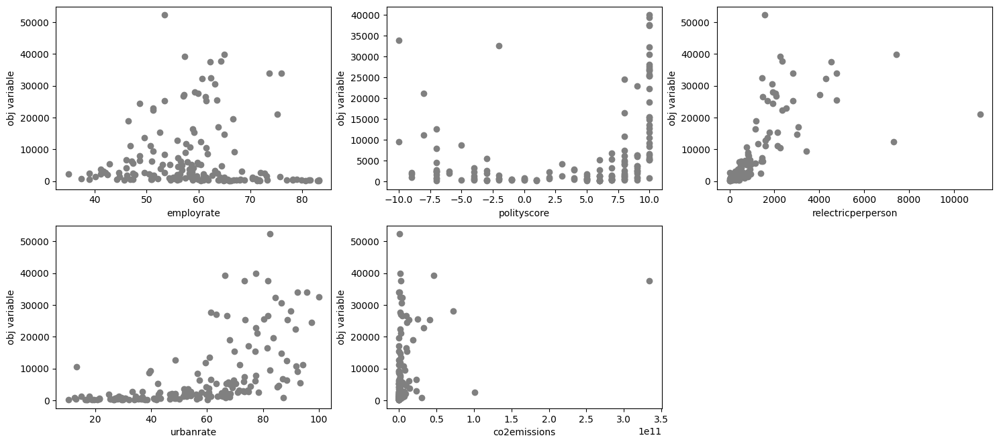

In [243]:
columns = ['employrate', 'polityscore','relectricperperson', 'urbanrate', 'co2emissions']
plt.figure(figsize=(18,12))
for i in range(len(columns)):
  plt.subplot(3,3,i+1)
  #plt.title(columns[i])
  plt.xlabel(columns[i])
  plt.ylabel('obj variable')
  plt.scatter(data[columns[i]], data['incomeperperson'], color ='grey')
plt.show()

Se destaca que no parece haber mucha colinealidad entre estas variables lo cual es bueno para la regresión.

#### 2.6.2 Relación entre indicadores y regiones

In [244]:
#continent_countries = pd.read_csv('/content/drive/MyDrive/maestria_mine/ciencia_de_datos_aplicada/taller_1/continents_countries.csv')
continent_countries = pd.read_csv('data/continents_countries.csv')

Buscamos los continentes y subregiones para cada país por medio del website https://www.gapminder.org/fw/four-regions/. Además obtenemos de esta misma web la clasifiación de ingresos.

In [245]:
def find_continent(x):
  country_list = continent_countries['name'].drop_duplicates()
  corrected_name = None
  name = []
  similarity = []
  for country in country_list:
    name.append(country)
    similarity.append(SequenceMatcher(None, x, country).ratio())
  name_similarity = pd.DataFrame({'name':name,'similarity':similarity})
  max_similarity = name_similarity['similarity'].max()
  corrected_name = name_similarity[name_similarity['similarity'] == max_similarity]['name'].values[0]
  return continent_countries[continent_countries['name'] == corrected_name]['four_regions'].values[0]
def find_subregion(x):
  country_list = continent_countries['name'].drop_duplicates()
  corrected_name = None
  name = []
  similarity = []
  for country in country_list:
      name.append(country)
      similarity.append(SequenceMatcher(None, x, country).ratio())
  name_similarity = pd.DataFrame({'name':name,'similarity':similarity})
  max_similarity = name_similarity['similarity'].max()
  corrected_name = name_similarity[name_similarity['similarity'] == max_similarity]['name'].values[0]
  return continent_countries[continent_countries['name'] == corrected_name]['eight_regions'].values[0]

def find_income_level(x):
  country_list = continent_countries['name'].drop_duplicates()
  corrected_name = None
  name = []
  similarity = []
  for country in country_list:
      name.append(country)
      similarity.append(SequenceMatcher(None, x, country).ratio())
  name_similarity = pd.DataFrame({'name':name,'similarity':similarity})
  max_similarity = name_similarity['similarity'].max()
  corrected_name = name_similarity[name_similarity['similarity'] == max_similarity]['name'].values[0]
  return continent_countries[continent_countries['name'] == corrected_name]['World bank, 4 income groups 2017'].values[0]

In [246]:
data_modifyed = data.copy()
data_modifyed['continent'] = data['country'].apply(lambda x : find_continent(x))
data_modifyed['subregion'] = data['country'].apply(lambda x : find_subregion(x))
data_modifyed['income_level'] = data['country'].apply(lambda x : find_income_level(x))

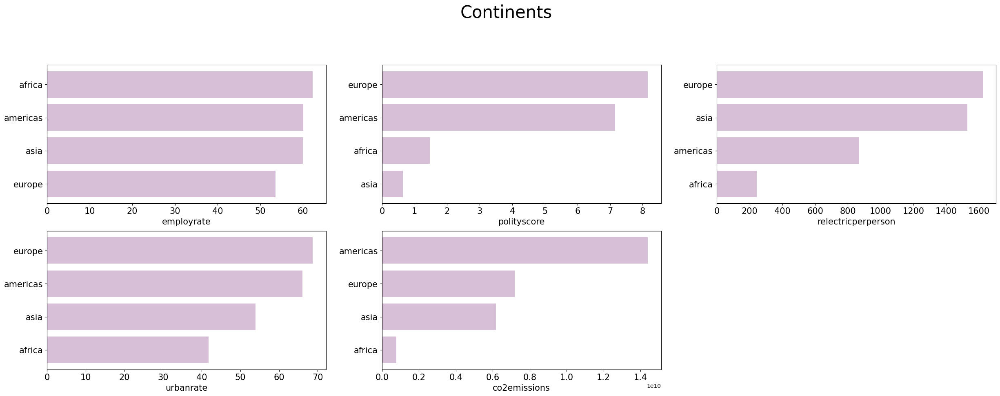

In [248]:
columns = ['employrate', 'polityscore','relectricperperson', 'urbanrate', 'co2emissions']
plt.figure(figsize=(30,15))
plt.suptitle('Continents',size=30)
for i in range(len(columns)):
  plt.subplot(3,3,i+1)
  #plt.title(columns[i])
  graph_data = data_modifyed[['continent', columns[i]]].groupby('continent').mean()
  labels = graph_data.index
  values = graph_data[columns[i]]
  graph_data=pd.DataFrame({'values':values,'labels':labels}).sort_values(by='values')
  plt.barh(graph_data['labels'],graph_data['values'],color='thistle')
  plt.xlabel(columns[i],size=15)
  plt.yticks(fontsize=15)
  plt.xticks(fontsize=15)
plt.show()

Se destaca que america es la principal productora de co2 entre los contienentes, mientras que africa no produce casi nada en comparación a los demás continentes. Que los mayores consumidores eléctricos por persona son asia y europa, además de que los continentes notoriamente con menor polityscore son asia y africa. Encontramos cifras de empleo similares en todos los continentes destacando las de africa y america. Y una urbanización mucho mayor en europa y america.

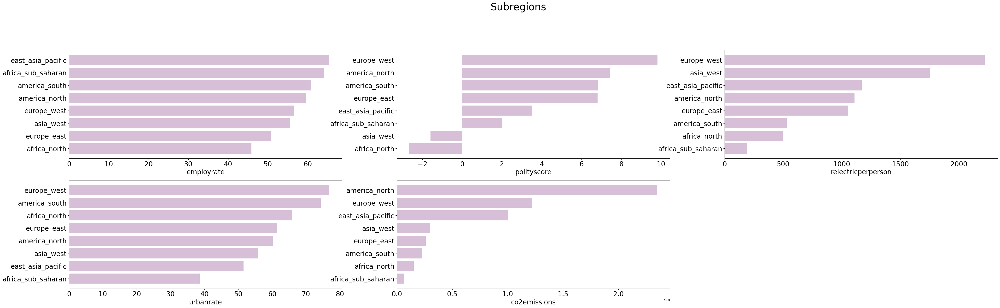

In [249]:
columns = ['employrate', 'polityscore','relectricperperson', 'urbanrate', 'co2emissions']
plt.figure(figsize=(50,20))
plt.suptitle('Subregions',size=30)
for i in range(len(columns)):
  plt.subplot(3,3,i+1)
  #plt.title(columns[i])
  graph_data = data_modifyed[['subregion', columns[i]]].groupby('subregion').mean()
  labels = graph_data.index
  values = graph_data[columns[i]]
  graph_data=pd.DataFrame({'values':values,'labels':labels}).sort_values(by='values')
  plt.barh(graph_data['labels'],graph_data['values'],color='thistle')
  plt.xlabel(columns[i],size=20)
  plt.yticks(fontsize=20)
  plt.xticks(fontsize=20)
plt.show()

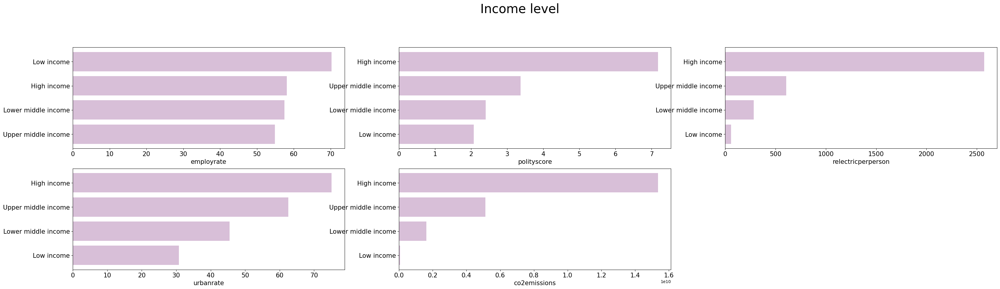

In [250]:
columns = ['employrate', 'polityscore','relectricperperson', 'urbanrate', 'co2emissions']
plt.figure(figsize=(40,15))
plt.suptitle('Income level',size=30)
for i in range(len(columns)):
  plt.subplot(3,3,i+1)
  #plt.title(columns[i])
  graph_data = data_modifyed[['income_level', columns[i]]].groupby('income_level').mean()
  labels = graph_data.index
  values = graph_data[columns[i]]
  graph_data=pd.DataFrame({'values':values,'labels':labels}).sort_values(by='values')
  plt.barh(graph_data['labels'],graph_data['values'],color='thistle')
  plt.xlabel(columns[i],size=15)
  plt.yticks(fontsize=15)
  plt.xticks(fontsize=15)
plt.show()

Se denota de esta gráfica que los que a mayor ingreso en los países. se tienen mayores emisiones de co2, mayor urbanización, menores tasas de empleo, mayor polityscore y mayor consumo eléctrico.

#### 2.6.3 Matriz de Correlación

<Axes: >

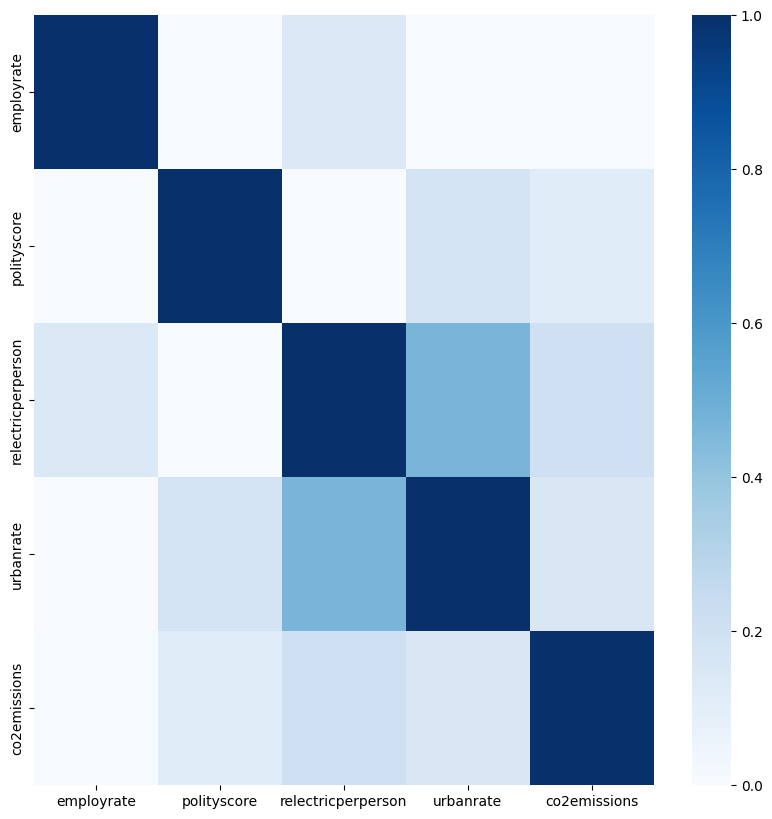

In [251]:
columns = ['employrate', 'polityscore','relectricperperson', 'urbanrate', 'co2emissions']
plt.figure(figsize=(10, 10))
sns.heatmap(data[columns].corr(), cmap="Blues", vmin=0, vmax=1)

Se observa que no hay tanta aparente correlación entre la variables más importantes escogidas. Sobre todo entre relectricperperson y urban rate, los cuáles evidentemente estan correlaciondas, pero aún así no es tan alto este coeficiente.

## 3. Preparación de datos

### 3.1 Separación train-test

Antes de hacer cualquier modificación sobre los datos hacer la separación train - test para no sesgar de ninguna forma posible nuestro conjunto de validación.

In [252]:
X_train, X_test, y_train, y_test = train_test_split(data.drop(['incomeperperson'],axis=1), data['incomeperperson'], test_size=0.2, random_state=77)

### 3.2 Pipeline de preparación de datos

Agregaremos 2 nuevas columnas obtenidas del dataset obtenidas de la web gapminder: https://www.gapminder.org/fw/four-regions/

In [253]:
#X_train['subregion'] = X_train['country'].apply(lambda x : find_subregion(x))
#X_train['income_level'] = X_train['country'].apply(lambda x : find_income_level(x))

In [254]:
X_train.drop_duplicates(['country']).sample(5)

,country,alcconsumption,armedforcesrate,breastcancerper100th,co2emissions,femaleemployrate,hivrate,internetuserate,lifeexpectancy,oilperperson,polityscore,relectricperperson,suicideper100th,employrate,urbanrate
126,Trinidad and Tobago,6.16,0.581165,51.1,NaN,50.500000,1.5,48.516818,70.124,NaN,10.0,2261.316713,14.547167,61.500000,13.22
114,Tajikistan,3.39,0.604873,13.2,1.041700e+08,50.099998,0.2,11.549391,67.529,NaN,-3.0,405.775385,2.648981,54.599998,26.46
131,Belize,5.92,0.758356,29.8,1.405800e+07,38.799999,2.3,12.645733,76.072,NaN,NaN,NaN,9.388796,56.799999,51.70
158,Bhutan,0.54,NaN,21.8,6.024333e+06,39.900002,0.2,13.598876,67.185,NaN,3.0,NaN,15.542603,58.400002,34.48
6,Mauritania,0.11,1.551262,28.1,5.681867e+07,45.299999,0.7,2.999803,58.582,NaN,-2.0,NaN,6.882952,46.900002,41.00


Eliminar duplicados por país, dado que al querer hacer un modelo para predecir el PIB de un país, no tendría sentido ponerle dos veces la información del mismo país dado que serían redundante (no habría información nueva).


In [255]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 130 entries, 117 to 99
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   country               130 non-null    object 
 1   alcconsumption        130 non-null    float64
 2   armedforcesrate       127 non-null    float64
 3   breastcancerper100th  129 non-null    float64
 4   co2emissions          128 non-null    float64
 5   femaleemployrate      130 non-null    float64
 6   hivrate               114 non-null    float64
 7   internetuserate       128 non-null    float64
 8   lifeexpectancy        130 non-null    float64
 9   oilperperson          51 non-null     float64
 10  polityscore           121 non-null    float64
 11  relectricperperson    104 non-null    float64
 12  suicideper100th       130 non-null    float64
 13  employrate            130 non-null    float64
 14  urbanrate             130 non-null    float64
dtypes: float64(14), object

Teniendo que tenemos relativamente pocos datos imputaremos los nulos con la media en todas las variables, excepto oilperperson, que tiene demasiados vacíos para ser imputados.

In [256]:
imp = SimpleImputer(missing_values=-1, strategy='mean')
X_train.drop(['oilperperson'],axis=1).sample(5)

,country,alcconsumption,armedforcesrate,breastcancerper100th,co2emissions,femaleemployrate,hivrate,internetuserate,lifeexpectancy,polityscore,relectricperperson,suicideper100th,employrate,urbanrate
57,Croatia,15.00,1.103279,62.1,3.100240e+08,39.400002,0.06,60.119707,76.640,9.0,1494.410268,14.776250,47.099998,57.28
90,Botswana,6.97,1.131910,33.4,7.894333e+07,38.700001,24.80,5.999836,53.183,8.0,454.795705,11.213970,46.000000,59.58
33,South Africa,10.16,0.331863,35.0,1.460985e+10,34.299999,17.80,12.334893,52.797,9.0,920.137600,15.714571,41.099998,60.74
71,Mongolia,3.41,1.211869,6.6,3.009343e+08,50.900002,0.06,12.900005,68.498,10.0,303.805449,13.089616,52.099998,57.18
151,Turkmenistan,5.00,0.931418,17.9,5.313037e+08,53.900002,NaN,2.199998,64.986,-9.0,351.166594,12.216769,58.500000,48.62


Aplicaremos onehot encoder para variables categóricas y standard scaler para variables numéricas.

In [335]:
# Custom Transformer to add a new column
class CustomTransformer(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        X_copy = X.copy()
        X_copy = X_copy.drop_duplicates(['country'])
        X_copy['subregion'] = X_copy['country'].apply(lambda x : find_subregion(x))
        X_copy['income_level'] = X_copy['country'].apply(lambda x : find_income_level(x))
        X_copy = X_copy.drop(['oilperperson','country'],axis=1)
        numeric_columns = list(X_copy.select_dtypes(include='number').columns)
        for column in numeric_columns:
            X_copy[column].replace(np.nan, np.mean(X_copy[column]), inplace=True)
        return X_copy


def create_pipe():
  variable_conversion = ColumnTransformer(
    transformers=[
        #'imputer', SimpleImputer(strategy='mean'),make_column_selector(dtype_include=np.number))
        ("num", StandardScaler(),  make_column_selector(dtype_include=np.number)),
        ("cat", OneHotEncoder(handle_unknown='ignore'), make_column_selector(dtype_include=object)),
    ]
  )
  pipe = Pipeline(steps=[
    ('custom_proccesing', CustomTransformer()),
    ('column_transformer',variable_conversion),
    ('polinomial',PolynomialFeatures()),
    ('regresion', Lasso()),
  ])
  return pipe

## 4. Entrenamiento de Modelo

Se entrena el modelo con un grid search usando grados polinomiales 1,2 y 3, y la regresión lasso, dado que nos brinda una mayor interpretabilidad en los resultados de los coeficientes.

In [336]:
pipeline = create_pipe()
parameters = {
              'polinomial__degree':[1,2,3],
              'regresion__alpha': [0.01, 0.1, 1, 10, 100]
              }
grid_search = GridSearchCV(pipeline, parameters, verbose=2, scoring='neg_mean_squared_error', cv=5)

In [337]:
%%time
grid_search.fit(X_train,y_train)

Fitting 5 folds for each of 15 candidates, totalling 75 fits


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.820e+07, tolerance: 9.269e+05
  model = cd_fast.enet_coordinate_descent(


[CV] END ........polinomial__degree=1, regresion__alpha=0.01; total time=   3.4s
[CV] END ........polinomial__degree=1, regresion__alpha=0.01; total time=   1.7s
[CV] END ........polinomial__degree=1, regresion__alpha=0.01; total time=   1.7s
[CV] END ........polinomial__degree=1, regresion__alpha=0.01; total time=   1.7s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.248e+07, tolerance: 1.004e+06
  model = cd_fast.enet_coordinate_descent(


[CV] END ........polinomial__degree=1, regresion__alpha=0.01; total time=   1.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.040e+07, tolerance: 9.269e+05
  model = cd_fast.enet_coordinate_descent(


[CV] END .........polinomial__degree=1, regresion__alpha=0.1; total time=   1.9s
[CV] END .........polinomial__degree=1, regresion__alpha=0.1; total time=   3.0s
[CV] END .........polinomial__degree=1, regresion__alpha=0.1; total time=   2.4s
[CV] END .........polinomial__degree=1, regresion__alpha=0.1; total time=   1.8s
[CV] END .........polinomial__degree=1, regresion__alpha=0.1; total time=   1.8s
[CV] END ...........polinomial__degree=1, regresion__alpha=1; total time=   1.9s
[CV] END ...........polinomial__degree=1, regresion__alpha=1; total time=   1.8s
[CV] END ...........polinomial__degree=1, regresion__alpha=1; total time=   1.7s
[CV] END ...........polinomial__degree=1, regresion__alpha=1; total time=   2.9s
[CV] END ...........polinomial__degree=1, regresion__alpha=1; total time=   2.7s
[CV] END ..........polinomial__degree=1, regresion__alpha=10; total time=   1.8s
[CV] END ..........polinomial__degree=1, regresion__alpha=10; total time=   1.7s
[CV] END ..........polinomia

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.042e+06, tolerance: 9.269e+05
  model = cd_fast.enet_coordinate_descent(


[CV] END .........polinomial__degree=2, regresion__alpha=0.1; total time=   1.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.770e+06, tolerance: 1.022e+06
  model = cd_fast.enet_coordinate_descent(


[CV] END .........polinomial__degree=2, regresion__alpha=0.1; total time=   1.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.021e+06, tolerance: 1.177e+06
  model = cd_fast.enet_coordinate_descent(


[CV] END .........polinomial__degree=2, regresion__alpha=0.1; total time=   1.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.021e+06, tolerance: 1.146e+06
  model = cd_fast.enet_coordinate_descent(


[CV] END .........polinomial__degree=2, regresion__alpha=0.1; total time=   1.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.632e+06, tolerance: 1.004e+06
  model = cd_fast.enet_coordinate_descent(


[CV] END .........polinomial__degree=2, regresion__alpha=0.1; total time=   3.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.712e+06, tolerance: 9.269e+05
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........polinomial__degree=2, regresion__alpha=1; total time=   2.7s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.496e+07, tolerance: 1.022e+06
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........polinomial__degree=2, regresion__alpha=1; total time=   1.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.690e+07, tolerance: 1.177e+06
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........polinomial__degree=2, regresion__alpha=1; total time=   1.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.733e+07, tolerance: 1.146e+06
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........polinomial__degree=2, regresion__alpha=1; total time=   1.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.555e+07, tolerance: 1.004e+06
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........polinomial__degree=2, regresion__alpha=1; total time=   1.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.722e+06, tolerance: 9.269e+05
  model = cd_fast.enet_coordinate_descent(


[CV] END ..........polinomial__degree=2, regresion__alpha=10; total time=   1.8s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.861e+06, tolerance: 1.022e+06
  model = cd_fast.enet_coordinate_descent(


[CV] END ..........polinomial__degree=2, regresion__alpha=10; total time=   3.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.206e+07, tolerance: 1.177e+06
  model = cd_fast.enet_coordinate_descent(


[CV] END ..........polinomial__degree=2, regresion__alpha=10; total time=   2.7s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.849e+07, tolerance: 1.146e+06
  model = cd_fast.enet_coordinate_descent(


[CV] END ..........polinomial__degree=2, regresion__alpha=10; total time=   1.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.421e+07, tolerance: 1.004e+06
  model = cd_fast.enet_coordinate_descent(


[CV] END ..........polinomial__degree=2, regresion__alpha=10; total time=   1.9s
[CV] END .........polinomial__degree=2, regresion__alpha=100; total time=   1.8s
[CV] END .........polinomial__degree=2, regresion__alpha=100; total time=   1.8s
[CV] END .........polinomial__degree=2, regresion__alpha=100; total time=   1.9s
[CV] END .........polinomial__degree=2, regresion__alpha=100; total time=   3.1s
[CV] END .........polinomial__degree=2, regresion__alpha=100; total time=   2.5s
[CV] END ........polinomial__degree=3, regresion__alpha=0.01; total time=   2.1s
[CV] END ........polinomial__degree=3, regresion__alpha=0.01; total time=   2.1s
[CV] END ........polinomial__degree=3, regresion__alpha=0.01; total time=   2.2s
[CV] END ........polinomial__degree=3, regresion__alpha=0.01; total time=   2.2s
[CV] END ........polinomial__degree=3, regresion__alpha=0.01; total time=   3.2s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.353e+06, tolerance: 9.269e+05
  model = cd_fast.enet_coordinate_descent(


[CV] END .........polinomial__degree=3, regresion__alpha=0.1; total time=   3.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.527e+06, tolerance: 1.022e+06
  model = cd_fast.enet_coordinate_descent(


[CV] END .........polinomial__degree=3, regresion__alpha=0.1; total time=   2.2s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.691e+06, tolerance: 1.177e+06
  model = cd_fast.enet_coordinate_descent(


[CV] END .........polinomial__degree=3, regresion__alpha=0.1; total time=   2.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.714e+06, tolerance: 1.146e+06
  model = cd_fast.enet_coordinate_descent(


[CV] END .........polinomial__degree=3, regresion__alpha=0.1; total time=   2.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.512e+06, tolerance: 1.004e+06
  model = cd_fast.enet_coordinate_descent(


[CV] END .........polinomial__degree=3, regresion__alpha=0.1; total time=   2.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.610e+06, tolerance: 9.269e+05
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........polinomial__degree=3, regresion__alpha=1; total time=   2.9s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.861e+06, tolerance: 1.022e+06
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........polinomial__degree=3, regresion__alpha=1; total time=   3.2s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.755e+06, tolerance: 1.177e+06
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........polinomial__degree=3, regresion__alpha=1; total time=   2.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.799e+06, tolerance: 1.146e+06
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........polinomial__degree=3, regresion__alpha=1; total time=   2.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.731e+06, tolerance: 1.004e+06
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........polinomial__degree=3, regresion__alpha=1; total time=   2.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.523e+07, tolerance: 9.269e+05
  model = cd_fast.enet_coordinate_descent(


[CV] END ..........polinomial__degree=3, regresion__alpha=10; total time=   2.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.609e+07, tolerance: 1.022e+06
  model = cd_fast.enet_coordinate_descent(


[CV] END ..........polinomial__degree=3, regresion__alpha=10; total time=   2.4s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.658e+07, tolerance: 1.177e+06
  model = cd_fast.enet_coordinate_descent(


[CV] END ..........polinomial__degree=3, regresion__alpha=10; total time=   3.4s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.815e+07, tolerance: 1.146e+06
  model = cd_fast.enet_coordinate_descent(


[CV] END ..........polinomial__degree=3, regresion__alpha=10; total time=   2.2s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.792e+07, tolerance: 1.004e+06
  model = cd_fast.enet_coordinate_descent(


[CV] END ..........polinomial__degree=3, regresion__alpha=10; total time=   2.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.357e+07, tolerance: 9.269e+05
  model = cd_fast.enet_coordinate_descent(


[CV] END .........polinomial__degree=3, regresion__alpha=100; total time=   2.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.519e+06, tolerance: 1.022e+06
  model = cd_fast.enet_coordinate_descent(


[CV] END .........polinomial__degree=3, regresion__alpha=100; total time=   2.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.979e+07, tolerance: 1.177e+06
  model = cd_fast.enet_coordinate_descent(


[CV] END .........polinomial__degree=3, regresion__alpha=100; total time=   2.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.451e+07, tolerance: 1.146e+06
  model = cd_fast.enet_coordinate_descent(


[CV] END .........polinomial__degree=3, regresion__alpha=100; total time=   3.5s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.838e+07, tolerance: 1.004e+06
  model = cd_fast.enet_coordinate_descent(


[CV] END .........polinomial__degree=3, regresion__alpha=100; total time=   2.8s
CPU times: user 2min 45s, sys: 10.9 s, total: 2min 56s
Wall time: 2min 49s


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('custom_proccesing',
                                        CustomTransformer()),
                                       ('column_transformer',
                                        ColumnTransformer(transformers=[('num',
                                                                         StandardScaler(),
                                                                         <sklearn.compose._column_transformer.make_column_selector object at 0x7f18f463ef50>),
                                                                        ('cat',
                                                                         OneHotEncoder(handle_unknown='ignore'),
                                                                         <sklearn.compose._column_transformer.make_column_selector object at 0x7f18f463e020>)])),
                                       ('polinomial', PolynomialFeatures()),
                                       ('regresion', Lasso())]),
             param_grid={'polinomial__degree': [1, 2, 3],
                         'regresion__alpha': [0.01, 0.1, 1, 10, 100]},
             scoring='neg_mean_squared_error', verbose=2)

In [338]:
best_model_lasso = grid_search.best_estimator_
best_model_lasso

Pipeline(steps=[('custom_proccesing', CustomTransformer()),
                ('column_transformer',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7f18f463eec0>),
                                                 ('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7f18f463e6b0>)])),
                ('polinomial', PolynomialFeatures(degree=1)),
                ('regresion', Lasso(alpha=100))])

Mejores parámetros encontrados:

In [346]:
grid_search.best_params_

{'polinomial__degree': 1, 'regresion__alpha': 100}

## 5. Evaluación del modelo

### 5.1 Rendimento con dataset de train

In [347]:
y_pred_train = best_model_lasso.predict(X_train)
n,p = X_train.shape

print('------------ Regresión Lasso con entrenamiento------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_train,y_pred_train))
print("R2-score: %.5f" % r2_score(y_train, y_pred_train) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_train, y_pred_train))*(n-1)/(n-p-1)) )

------------ Regresión Lasso con entrenamiento------------
Residual sum of squares (MSE): 18335332.31
R2-score: 0.81969
Adj R2-score: 0.79596


### 5.2 Rendimento con dataset de test

In [348]:
y_pred_test = best_model_lasso.predict(X_test)
n,p = X_test.shape

print('------------ Regresión Lasso con evaluación ------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_test,y_pred_test))
print("R2-score: %.5f" % r2_score(y_test, y_pred_test) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_test, y_pred_test))*(n-1)/(n-p-1)) )

------------ Regresión Lasso con evaluación ------------
Residual sum of squares (MSE): 18935617.37
R2-score: 0.86221
Adj R2-score: 0.74063


Se podría hablar de un ligero bajo ajuste dado que el r2 es menor en el dataset de entrenamiento que en el dataset de testing. Sin embargo con un r cuadrado de 0.86 para el dataset de test, podemos indicar que un gran porcentaje de la varianza de pib es explicado por el modelo.

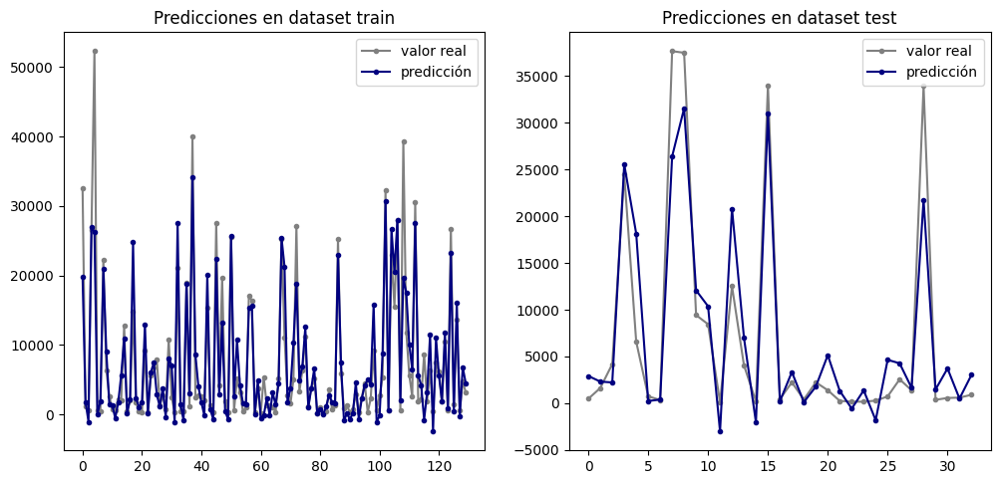

In [349]:
plt.figure(figsize = (12,12))
plt.subplot(2,2,1)
plt.title('Predicciones en dataset train')
a = 0
b= len(y_pred_train)
xvals = list(range(b-a))
plt.plot(xvals, y_train, '.-', color='grey', label='valor real')
plt.plot(xvals, y_pred_train, '.-', color = 'navy',label = 'predicción')
plt.legend()
plt.subplot(2,2,2)
plt.title('Predicciones en dataset test')
a = 0
b= len(y_pred_test)
xvals = list(range(b-a))
plt.plot(xvals, y_test, '.-', color='grey', label='valor real')
plt.plot(xvals, y_pred_test, '.-', color = 'navy',label = 'predicción')
plt.legend()
plt.show()

### 5.3 Coeficientes de la regresión realizada

In [370]:
cat_names = best_model_lasso['column_transformer'].transformers_[1][1].get_feature_names_out()
num_names = best_model_lasso['column_transformer'].transformers_[0][1].feature_names_in_
col_names = list(num_names) + list(cat_names)
print('Intercepto:', best_model_lasso['regresion'].intercept_)
coef = list(zip(['Intercepto'] + list(col_names), [best_model_lasso['regresion'].intercept_] + list(best_model_lasso['regresion'].coef_)))
coef = pd.DataFrame(coef,columns=['Variable','Parámetro']).sort_values(by='Parámetro',ascending=False)
coef

Intercepto: 7099.776439693434


,Variable,Parámetro
0,Intercepto,7099.776440
22,income_level_High income,4211.056427
8,lifeexpectancy,4170.587768
23,income_level_Low income,2035.088740
11,suicideper100th,1621.910620
4,co2emissions,1308.132837
14,subregion_africa_north,982.356540
6,hivrate,818.058666
20,subregion_europe_east,651.255540
9,polityscore,611.328210


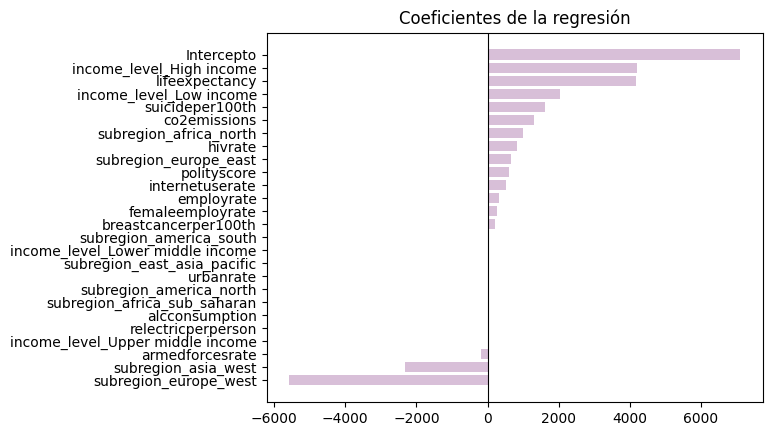

In [372]:
coef = coef.sort_values(by='Parámetro')
plt.barh(coef['Variable'],coef['Parámetro'],color='thistle')
plt.axvline(x=0,color='k',lw=.8)
plt.title('Coeficientes de la regresión')
plt.show()

Se puede observar de acuerdo a los valores obtenidos en los coeficientes que las variables que son realmente importantes para este modelo se comportan de la siguiente forma:

- La clasificación de high income por parte del banco mundial parece ser la que más indica que un país es apto para préstamos.

- Luego encontramos que una alta esperanza de vida es un buen indicador de que para un pib alto.

- las emisiones de co2, internetuserate, el polityscore y el employrate, también muestran una relación positiva con un pib alto.

- El porcentaje de personas en fuerzas armadas disminuye el pib.

### 5.4 Validación de los supuestos de la regresión

#### 5.4.1 Colinealidad

<ipython-input-353-b9cfbf148462>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(X_train.corr(), cmap="Blues", vmin=0, vmax=1)


<Axes: >

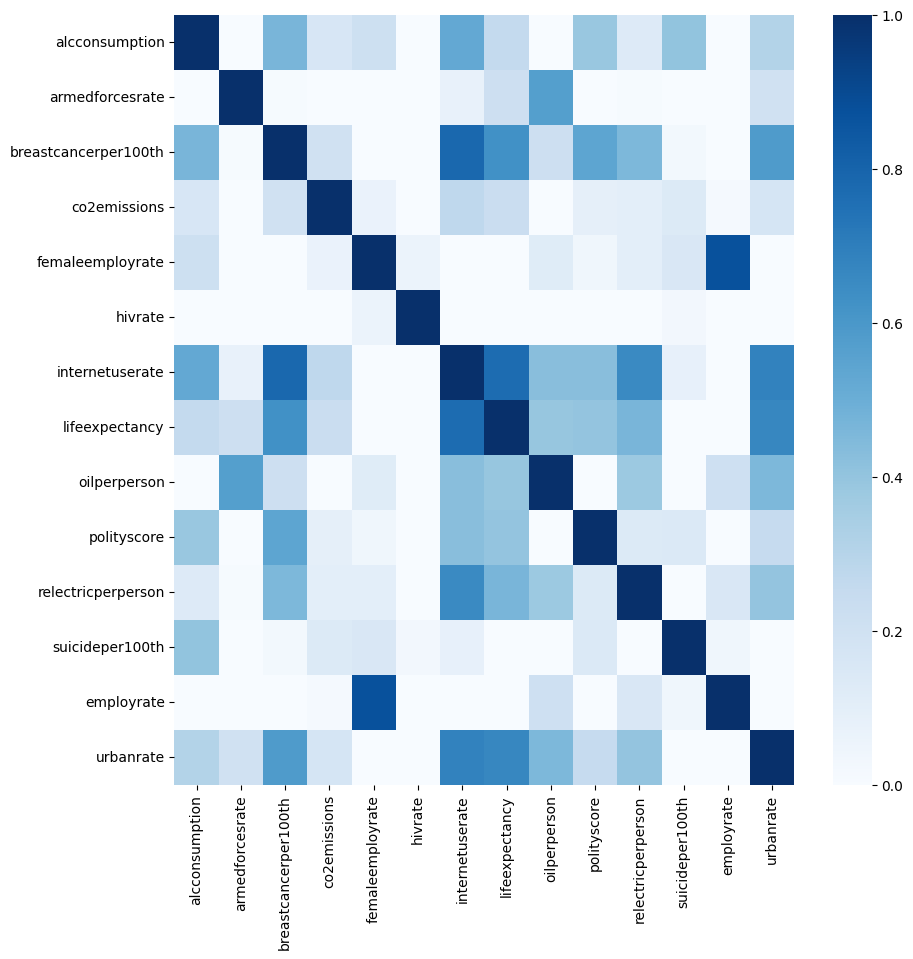

In [353]:
plt.figure(figsize=(10, 10))
sns.heatmap(X_train.corr(), cmap="Blues", vmin=0, vmax=1)

Vemos correlaciones importantes únicamente entre femaleemployrate y employrate, lo cual es bastante lógico pero no necesariamente son causales. Y adeás entre urban rate, internetuserate y lifeexpectancy, sin embargo, esta condición podría decirse que se cumple.

#### 5.4.2 Linealidad

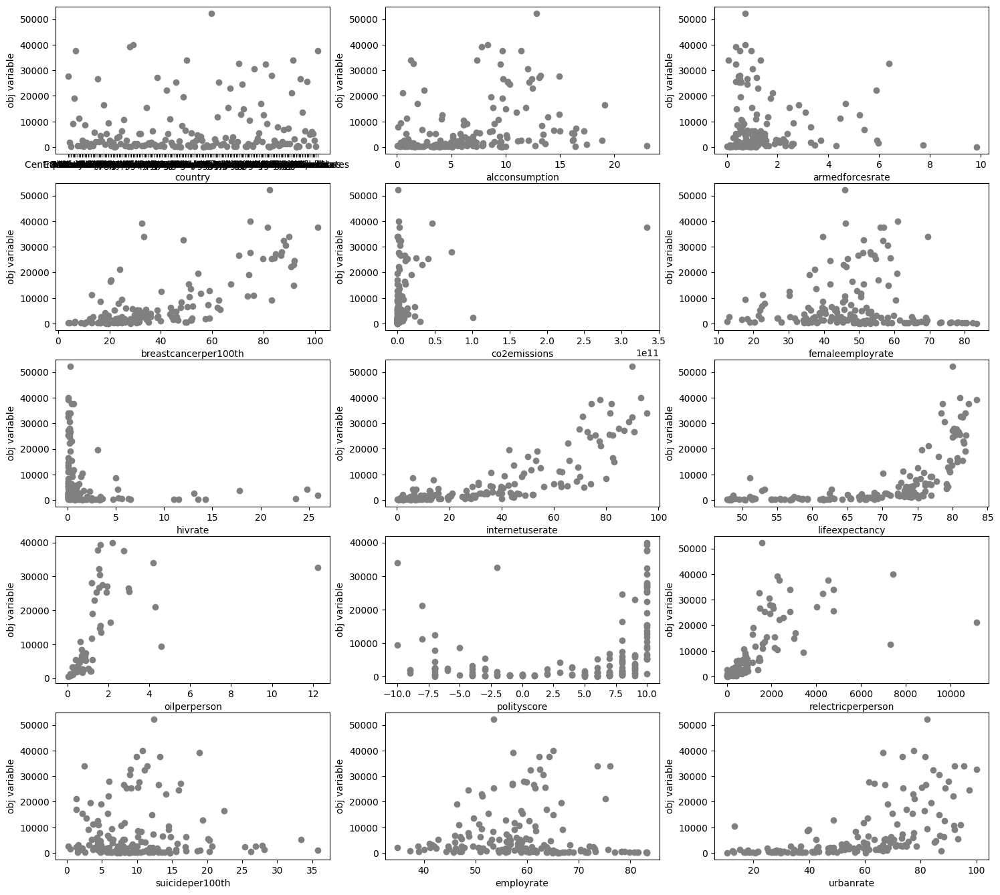

In [352]:
columns = list(data.drop(['incomeperperson'],axis=1).columns)
plt.figure(figsize=(18,20))
for i in range(len(columns)):
  plt.subplot(int(len(columns)/3)+1,3,i+1)
  #plt.title(columns[i])
  plt.xlabel(columns[i])
  plt.ylabel('obj variable')
  plt.scatter(data[columns[i]], data['incomeperperson'], color ='grey')
plt.show()

Solo con ver la distribución de los datos, se puede observar que no necesariamente existe alguna correlación lineal entre la mayoría de los indicadores y la variable objetivo. Por lo que este supuesto no se cumple en su mayoría.

#### 5.4.3  Normalidad de errores

In [355]:
errors = (best_model_lasso.predict(X_train)-y_train).values

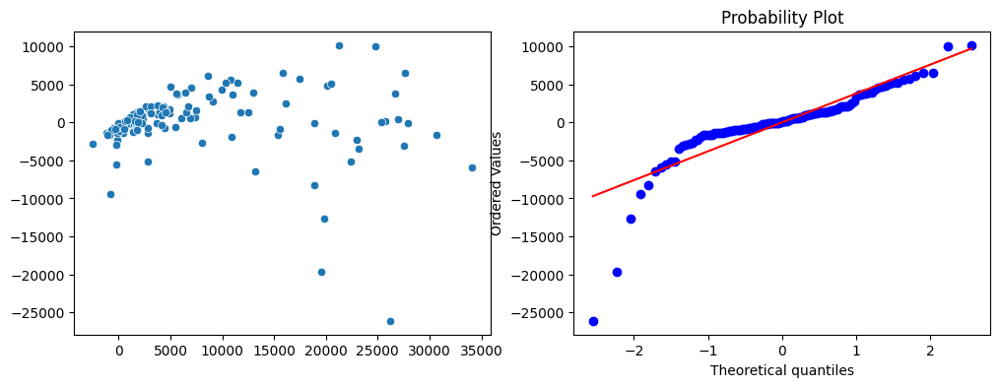

In [380]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Dispersión
sns.scatterplot(x=best_model_lasso.predict(X_train), y=errors, ax=axes[0])

# q-q plot
_ = stats.probplot(errors, dist="norm", plot=axes[1])

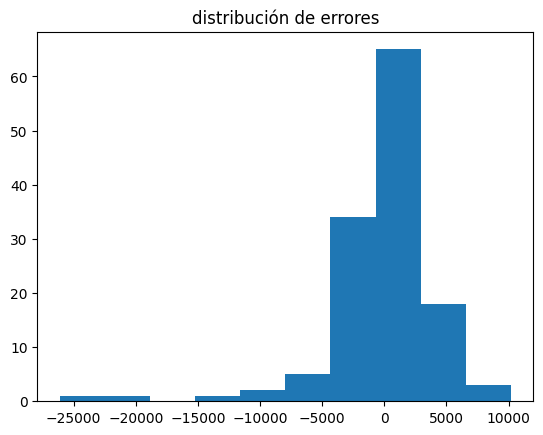

In [361]:
plt.title('distribución de errores')
plt.hist(errors)
plt.show()

Fuera de algunos outliers, parece que los errores sí tienen una distribución normal.

#### 5.4.4  Varianza constante en los errores (Homocedasticidad)

<Axes: >

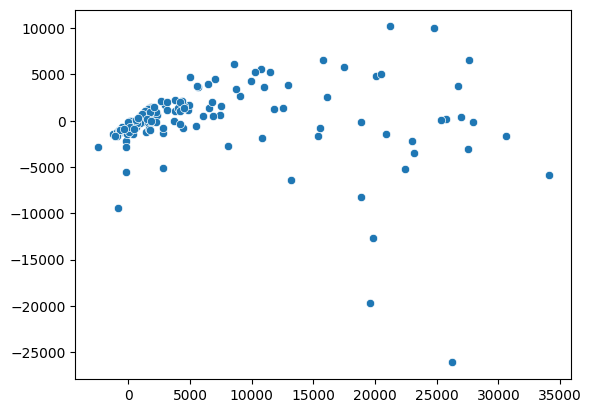

In [379]:
sns.scatterplot(x = best_model_lasso.predict(X_train), y=errors)

No parece que se cumpla del todo una varianza constante en los errores. A pesar de todo esto el modelo tiene un buen rendimiento de rscore 0.86 para el dataset de test.